In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# May be necessary to add the base path of LittleStarr directory to sys.path
BASE_PATH = "/home/claysmyth/code/"

In [513]:
import sys
sys.path.append(BASE_PATH)
import pandas as pd
import numpy as np
import glob
from functools import partial
from LittleStarr.visualization_functions.rcs_visualization import plot_spec_hypno_overlay
from utils import get_proportion_Nans
import dask.dataframe as dd
import polars as pl
from multipledispatch import dispatch
import scipy.signal as signal
import matplotlib.pyplot as plt
import scipy.stats as stats

In [45]:
# Parameters
parent_directory = '/media/longterm_hdd/Clay/Sleep_10day/RCS02L/Overnight'
desired_columns = ['localTime', 'DerivedTime', 'TD_key0', 'TD_key2', 'TD_key3', 'SleepStage']

In [7]:
raw_data_files = glob.glob(parent_directory+'/*.parquet')

In [8]:
raw_data_files

['/media/longterm_hdd/Clay/Sleep_10day/RCS02L/Overnight/Session1651816921878_06-May-2022.parquet',
 '/media/longterm_hdd/Clay/Sleep_10day/RCS02L/Overnight/Session1651562580528_03-May-2022.parquet',
 '/media/longterm_hdd/Clay/Sleep_10day/RCS02L/Overnight/Session1651734250087_05-May-2022.parquet',
 '/media/longterm_hdd/Clay/Sleep_10day/RCS02L/Overnight/Session1650607956069_22-Apr-2022.parquet',
 '/media/longterm_hdd/Clay/Sleep_10day/RCS02L/Overnight/Session1651304449313_30-Apr-2022.parquet',
 '/media/longterm_hdd/Clay/Sleep_10day/RCS02L/Overnight/Session1650521639978_21-Apr-2022.parquet',
 '/media/longterm_hdd/Clay/Sleep_10day/RCS02L/Overnight/Session1651206439758_29-Apr-2022.parquet',
 '/media/longterm_hdd/Clay/Sleep_10day/RCS02L/Overnight/Session1651124299038_28-Apr-2022.parquet',
 '/media/longterm_hdd/Clay/Sleep_10day/RCS02L/Overnight/Session1651041300914_27-Apr-2022.parquet',
 '/media/longterm_hdd/Clay/Sleep_10day/RCS02L/Overnight/Session1651649900220_04-May-2022.parquet']

In [ ]:
# Compare polars and Dask efficiency
    # populate get_sleep_stage_data (allow for zero padding of non-continuous)
# populate get_PSD function (allow channels to be a parameter, up to 4 channels)
    # If I do 0 overlap, then I do not have to worry about non-contiguous 30 second epochs
# populate plot_PSD function
# Run unit tests

In [414]:
rcs_dd = dd.read_parquet(
    parent_directory+'/*.parquet',
    columns= desired_columns
                         )

In [ ]:
rcs_dd.head()

In [415]:
rcs_pl = pl.read_parquet(
    parent_directory+'/*.parquet',
    columns = desired_columns
    )


In [619]:
@dispatch(dd.core.DataFrame, list)
def get_sleep_stage_dict(df, cols):
    """
    returns dictionary with key-value pair as sleep stage (int) : n x size(cols) dataframe corresponding to that sleep stage
    :param df: Either a pandas, Dask, or polars dataframe.
    :param cols: columns to keep in sleep_stage_dict
    :return: dict of each sleep stage paired with raw data corresponding to that stage
    """
    sleep_stages = df['SleepStage'].unique().compute().values
    df_gb = df.groupby('SleepStage')
    sleep_stage_data_dict = {stage: df_gb[cols].get_group(stage) for stage in sleep_stages}
    return sleep_stage_data_dict



In [490]:
%%time
cols = ['DerivedTime', 'TD_key0', 'TD_key2', 'TD_key3', 'SleepStage']
dd_data_dict = get_sleep_stage_dict(rcs_dd, ['localTime'] + cols)

CPU times: user 3.18 s, sys: 2.43 s, total: 5.61 s
Wall time: 1.94 s


In [620]:
@dispatch(pl.internals.dataframe.frame.DataFrame, list)
def get_sleep_stage_dict(df, cols):
    """
    returns dictionary with key-value pair as sleep stage (int) : n x size(cols) dataframe corresponding to that sleep stage
    :param df: Either a pandas, Dask, or polars dataframe.
    :param cols: columns to keep in sleep_stage_dict
    :return: dict of each sleep stage paired with raw data corresponding to that stage
    """
    sleep_stages = df.select('SleepStage').unique().to_numpy().squeeze()
    sleep_stage_data_dict = {stage: df.select(pl.col(cols)).filter(pl.col('SleepStage') == stage) for stage in sleep_stages}
    return sleep_stage_data_dict



In [492]:
%%time
pl_data_dict = get_sleep_stage_dict(rcs_pl, cols)

CPU times: user 32.4 s, sys: 3.09 s, total: 35.5 s
Wall time: 3.63 s


In [606]:
def get_PSD_as_array(data, sample_rate, epoch_length, window_length, overlap, column_format=False):
    """
    Takes time series data of arbitrary complexity, and reshapes the time-series portion into a (n x epoch_length) array, then applies the welch method of PSD estimation on each row in (n).
    Assumes the last 2 dimensions are (num channels x num time samples). If last 2 dimensions are (num time samples x num channels), then column_format should be toggled to True.
    :param data: Raw time series data, where last two dimensions should be (num channels x num time samples) or (num samples x num time channels).
    :param sample_rate: sample rate of time series samples [Hz]
    :param epoch_length: number of samples in the resulting row, on which PSD is calculated [int]
    :param window_length: number of samples for welch window [int]
    :param overlap: number of samples to overlap welch windows [int]
    :param column_format: Set to true if last 2 dimensions of input data is (num time samples x num channels)
    :return:
        f: output array f of the signal.welch
        Pxx_den: an (n x f) array denoting the resulting power spectral estimation for each epoch.
    """
    if column_format:
        data = np.transpose(data, np.shape(data)[:-2] + (-1, -2))
        
    # Ignore tail end of data that does not fit into welch epoch    
    num_chunks = (np.shape(data)[-1] - epoch_length) // epoch_length
    
    # Chunk the time series portion of the data into an (n x epoch_length) array. 
    # The last dimension will be a continuous section of data of epoch length, and second to last will be contiguous epochs.
    data_epoch_blocked = np.reshape(data[...,:num_chunks*epoch_length], (np.shape(data)[:-1]) + (num_chunks, epoch_length))
    
    # Run PSD calculation on each epoch of data (the last dimension)
    f, Pxx_den = signal.welch(data_epoch_blocked, fs=sample_rate, nperseg=window_length, noverlap=overlap)

    return f, Pxx_den

In [633]:
def get_PSD_dict(data_dict, cols, value_type, **kwargs):
    """
    Wrapper function for get_PSD_as_array(...). Processes data values in data_dict into PSD_arrays
    :param data_dict: dictionary pairs of key - dataframe [either dask, pandas, or polars]
    :param cols: [list of strings] cols to extract from dataframe values. Are ultimately transformed into numpy arrays
    :param value_type: [string] indicates what type of dataframe are stored as values in data_dict
    :param **kwargs: parameter values for get_PSD_as_array(...)
    :return:
        f: output array f of the signal.welch
        psd_dictionary: keys of data_dict pairs with Pxx_den, as outputted from get_PSD_as_array(...)
    """
    if value_type == 'polars':
        psd_dict = {key: get_PSD_as_array(data=value.select(cols).fill_null(0).to_numpy().T, **kwargs)
                    for key, value in data_dict.items()}
    elif value_type == 'dask':
        psd_dict = {key: get_PSD_as_array(data=value[cols].fillna(0).compute().values.T, **kwargs)
                    for key, value in data_dict.items()}
    elif value_type == 'pandas':
        psd_dict = {key: get_PSD_as_array(data=value[cols].fillna(0).values.T, **kwargs)
                    for key, value in data_dict.items()}
    else:
        print('Not a recognized value_type. Allowed types are dask, pandas, or polars')
        return
    keys = list(psd_dict.keys())
    f = psd_dict[keys[0]][0]
    return f, {key: value[1] for key, value in psd_dict.items()}


In [615]:
def plot_PSD(psd_array, labels, title, f, freq_range=np.s_[1:101], plot_SEM=False, SEM=[]):
    """
    NOTE: Best to take the log of the PSD array prior to function call.
    Plots elements, or values, of psd_array with corresponding labels.
    :param psd_array: [list-like or dict] of psd row vectors that are ultimately plotted.
    :param labels: [list-like or dict] of strings. Must have same order or matching keys to psd_array
    :param title: [str]
    :param freq_range: [np.s_[]] slice of frequencies to plot on x-axis
    :param plot_SEM: [bool] flag to plot error-bars on psds
    :param SEM: [list-like or dict] standard error measure. Same dimension as psd_array
    :return: None
    """
    plt.figure(figsize=(10, 8))
    plt.xlabel('Frequency [Hz]', size=15)
    plt.ylabel('PSD [log(mV^2/Hz)]', size=15)
    if type(psd_array) == dict:
        for i in labels.keys():
            plt.plot(f[freq_range], psd_array[i][freq_range], label=labels[i])
            if plot_SEM:
                sem = SEM[i][freq_range]
                plt.fill_between(f[freq_range], psd_array[i][freq_range]-sem, psd_array[i][freq_range]+sem, alpha=0.2)
    else:
        for i in range(len(labels)):
            plt.plot(f[freq_range], psd_array[i][freq_range], label=labels[i])
            if plot_SEM:
                sem = SEM[i][freq_range]
                plt.fill_between(f[freq_range], psd_array[i][freq_range]-sem, psd_array[i][freq_range]+sem, alpha=0.2)

    plt.legend(prop={'size': 20}, loc='upper right')
    plt.title(title, size=20)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.xticks(size=15)
    plt.show()

    return None

In [630]:
psd_params = {'sample_rate':500, 'epoch_length':500, 'window_length':500, 'overlap':0, 'column_format':False}
f, psd_dict = get_PSD_dict(pl_data_dict, ['TD_key0', 'TD_key2', 'TD_key3'], 'polars', **psd_params)

In [634]:
def process_PSDs_for_channel(psd_dict, channel):
    """
    Processes PSD arrays for plotting. Processes PSD arrays by taking the log of the psd array for each channel, and calculating the average and sem of the log(data) for each channel
    :param psd_dict: key-value pairing, where each value is an (num channels x n x psd length) array of power spectral density estimates
    :param channel: [tuple, e.g. (1,2) or (1) or just 1] index on which to process the psd array
    :return: average [1 x psd length] and standard error measure [1 x psd length] of the input psd array
    """
    ave = {}
    sem = {}
    for key, arr in psd_dict.items():
        arr_pruned = arr[channel][np.where(~(arr[channel] == 0).any(axis=-1)),:].squeeze()
        arr_log = np.log10(arr_pruned)
        ave[key] = np.average(arr_log, axis=-2)
        sem[key] = stats.sem(arr_log, axis=-2)
    return ave, sem


In [631]:
td_key0_ave, td_key0_sem = process_PSDs_for_channel(psd_dict, 0)
td_key2_ave, td_key2_sem = process_PSDs_for_channel(psd_dict, 1)
td_key3_ave, td_key3_sem = process_PSDs_for_channel(psd_dict, 2)

In [595]:
labels = {2:'N3', 3:'N2', 4:'N1', 5:'REM', 6:'Awake'}

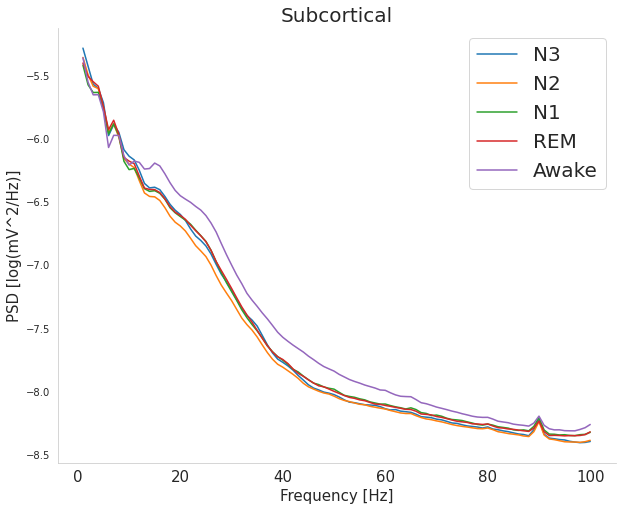

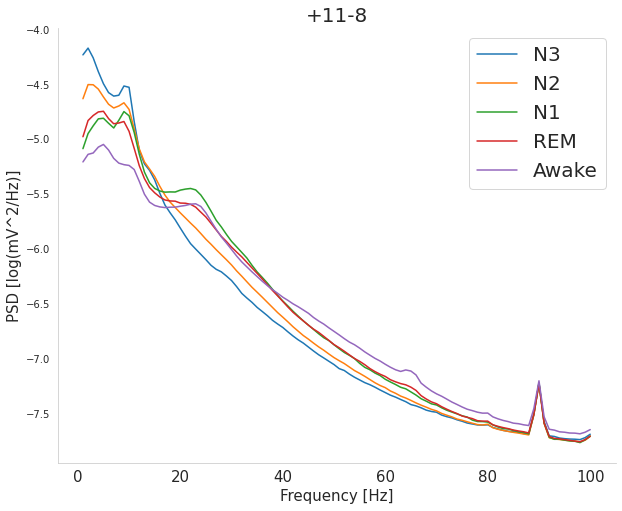

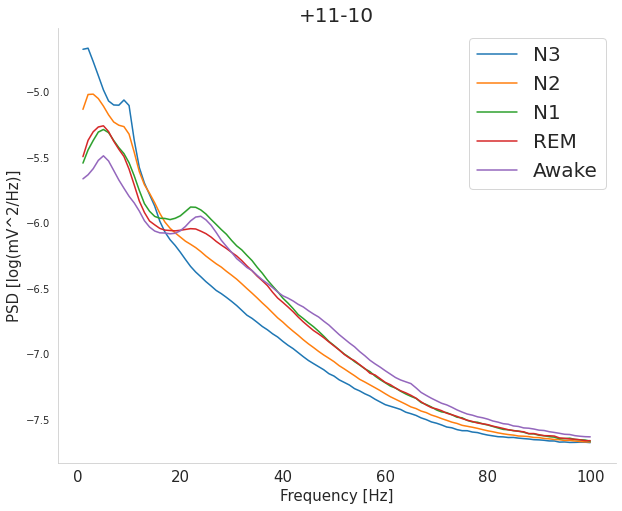

In [632]:
plot_PSD(td_key0_ave, labels, 'Subcortical', f, plot_SEM=True, SEM=td_key0_sem)
plot_PSD(td_key2_ave, labels, '+11-8', f, plot_SEM=True, SEM=td_key2_sem)
plot_PSD(td_key3_ave, labels, '+11-10', f, plot_SEM=True, SEM=td_key3_sem)

In [ ]:
# RUN UNIT TESTS

In [429]:
rcs_pl.select(cols).filter(rcs_pl['DerivedTime'] == 1650523777323)

DerivedTime,TD_key0,TD_key2,TD_key3,SleepStage
f64,f64,f64,f64,f64
1.6505e12,-0.395108,-0.113283,0.031153,2.0


[1.0000e+00 2.0000e+00 3.0000e+00 ... 1.5281e+04 1.5282e+04 1.5283e+04]
(200, 15283)
[ 6 14 21 28]


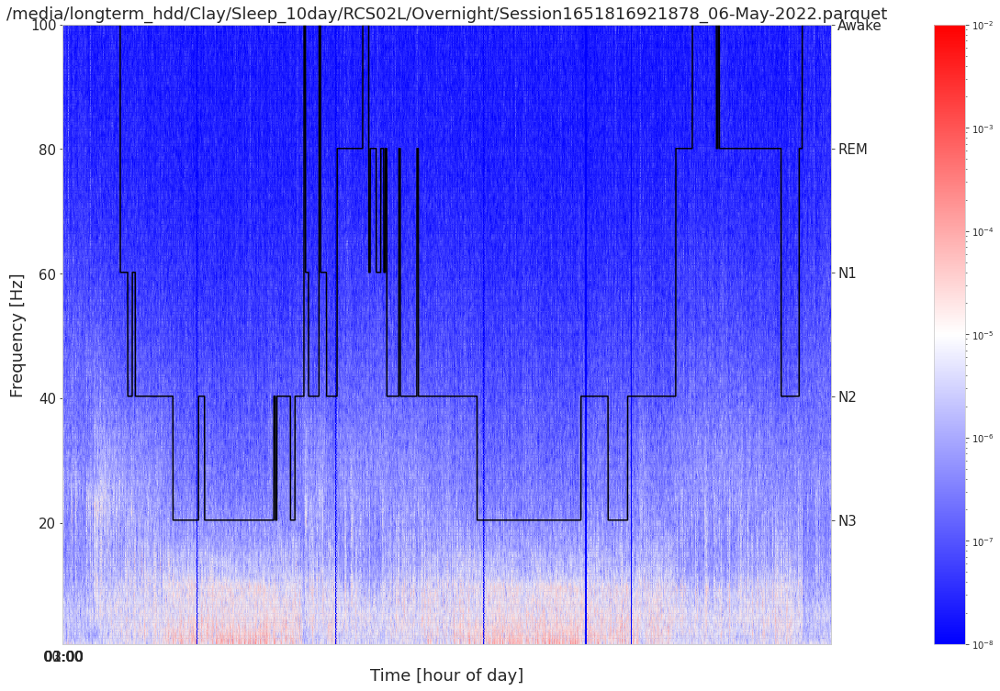

[1.0000e+00 2.0000e+00 3.0000e+00 ... 2.0443e+04 2.0444e+04 2.0445e+04]
(200, 20445)
[ 4 11 18 26 33 40]


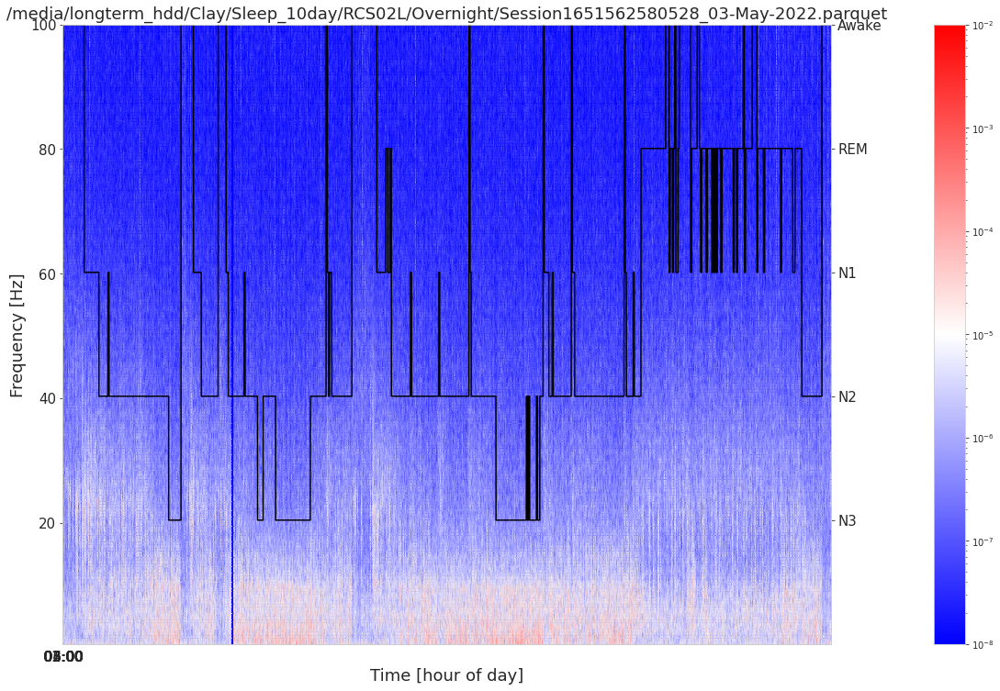

[1.0000e+00 2.0000e+00 3.0000e+00 ... 2.2731e+04 2.2732e+04 2.2733e+04]
(200, 22733)
[ 6 13 21 28 35 42]


KeyboardInterrupt: 

In [652]:
plot_spec = partial(plot_spec_hypno_overlay, sample_rate=500, window_length=1000, overlap=500, freq_range=np.s_[1:201], max=10**-2)

for f in raw_data_files:
    df_tmp = pd.read_parquet(f)
    plot_spec(df_tmp, 'TD_key3', title=f)

In [262]:
np.shape(data_epoch_blocked)

(3, 42185, 500)

In [270]:
(data_epoch_blocked == 0).all(axis=-1)

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [273]:
data_epoch_blocked[~(data_epoch_blocked == 0).all(axis=-1),:]

array([[ 0.      ,  0.      ,  0.      , ..., -0.244353,  0.247498,
         0.342072],
       [-0.150538, -0.192185,  0.312464, ...,  0.040563,  0.283397,
        -0.154659],
       [-0.358992,  0.122231,  0.247607, ...,  0.265068, -0.077004,
        -0.41745 ],
       ...,
       [ 0.018735, -0.034639,  0.075268, ...,  0.035183,  0.097489,
         0.047274],
       [-0.043244,  0.053156,  0.095202, ...,  0.093241,  0.065138,
        -0.038451],
       [ 0.035946,  0.096726,  0.05076 , ...,  0.085507, -0.032569,
         0.003268]])

In [241]:
data_epoch_blocked[1,-1,:]

array([-1.33801e-01, -9.50300e-03, -1.20950e-02, -1.31317e-01,
       -1.22786e-01, -2.59200e-03, -3.60690e-02, -1.57127e-01,
       -1.18250e-01, -1.61990e-02, -7.37580e-02, -1.88121e-01,
       -1.19438e-01, -3.80130e-02, -1.28294e-01, -2.26890e-01,
       -1.26458e-01, -6.30670e-02, -1.56047e-01, -2.20518e-01,
       -9.55720e-02, -4.75160e-02, -1.37473e-01, -1.59395e-01,
       -2.17060e-02, -2.70000e-03, -1.05507e-01, -9.73000e-02,
        3.93090e-02,  3.40170e-02, -7.49460e-02, -4.03890e-02,
        8.38010e-02,  5.68030e-02, -4.84880e-02,  2.28940e-02,
        1.28618e-01,  6.47950e-02, -3.67170e-02,  5.53990e-02,
        1.25594e-01,  3.13170e-02, -5.20520e-02,  5.39960e-02,
        8.43410e-02, -3.90930e-02, -1.00324e-01,  1.16630e-02,
        8.74700e-03, -1.21706e-01, -1.46328e-01, -3.42330e-02,
       -6.09070e-02, -1.90713e-01, -1.73110e-01, -6.47950e-02,
       -1.13823e-01, -2.35205e-01, -1.84557e-01, -9.42760e-02,
       -1.67602e-01, -2.69006e-01, -1.81641e-01, -1.101

In [ ]:
# For plot_PSD, plot sleep stages for each channel. So it will be [i,j] where i is channel and j is sleep stage

In [ ]:
def plot_PSD(psd_array, labels, max_freq_ind=1, min_freq_ind=101):


In [ ]:
# RUN UNIT TESTS

In [ ]:
# CREATE PSD PLOT OF EACH SLEEP STAGE

In [34]:
plot_spec = partial(plot_spec_hypno_overlay, sample_rate=500, window_length=1000, overlap=500, freq_range=np.s_[1:201], max=10**-2)

for overnight in raw_data_files:
    df_tmp = pd.read_parquet(overnight)
    plot_spec(df_tmp, 'TD_key0', title=f'{overnight.split("/")[-3]} : {overnight.split("/")[-1]} : Subcortical')
    print('Percent Disconnects: ' + get_percent_Nans(df_tmp, 'TD_key0'))
    plot_spec(df_tmp, 'TD_key2', title=f'{overnight.split("/")[-3]} : {overnight.split("/")[-1]} : +11-8')
    print('Percent Disconnects: ' + get_proportion_Nans(df_tmp, 'TD_key2'))
    plot_spec(df_tmp, 'TD_Key3', title=f'{overnight.split("/")[-3]} : {overnight.split("/")[-1]} : +11-10')
    print('Percent Disconnects: ' + get_proportion_Nans(df_tmp, 'TD_key3'))

ValueError: Invalid vmin or vmax

ValueError: Invalid vmin or vmax

<Figure size 1296x360 with 2 Axes>

/tmp/ipykernel_266878/1251878469.py:25: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  mesh = fig1.gca().pcolormesh(t, f, tmp, shading='gouraud', norm=colors.LogNorm(vmin=tmp.min(), vmax=max), cmap=cmap)


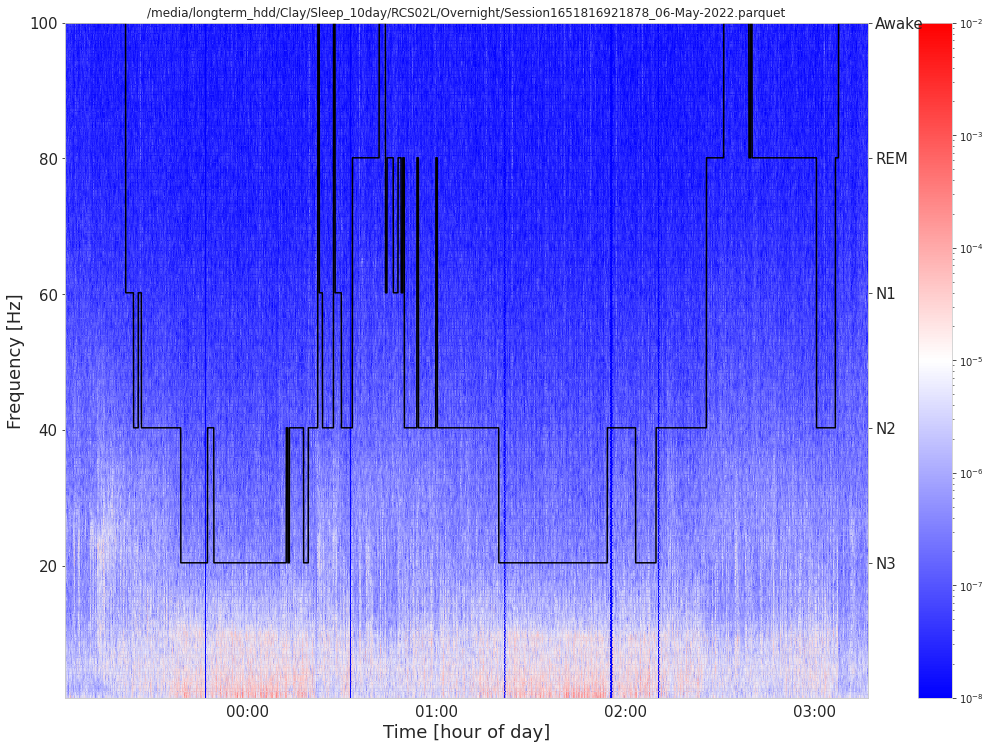

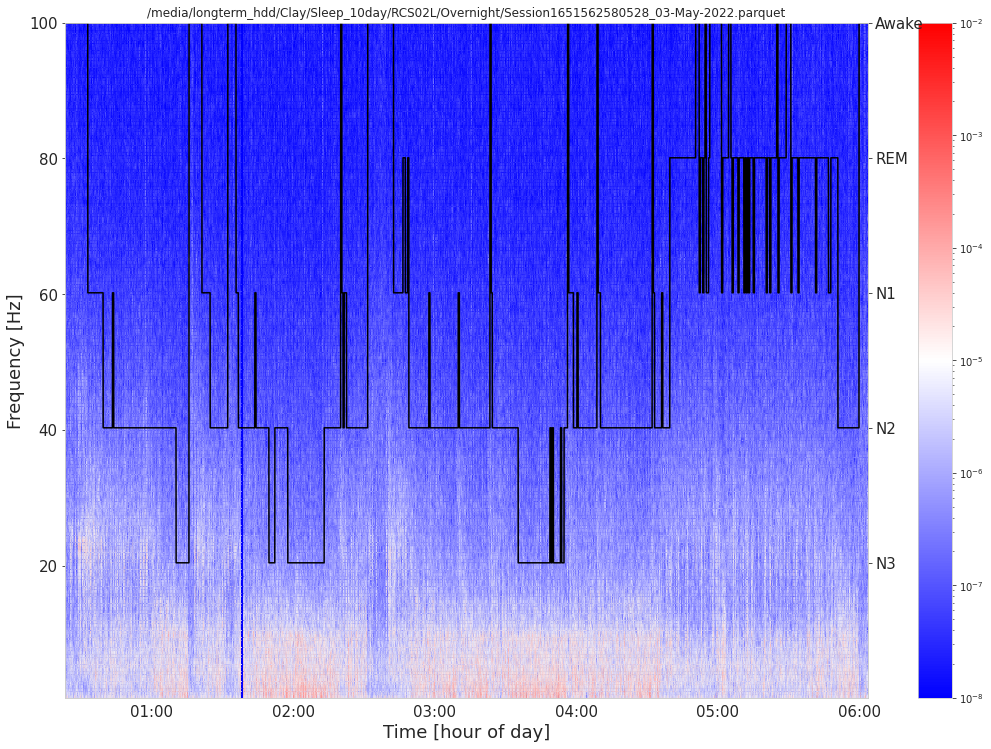

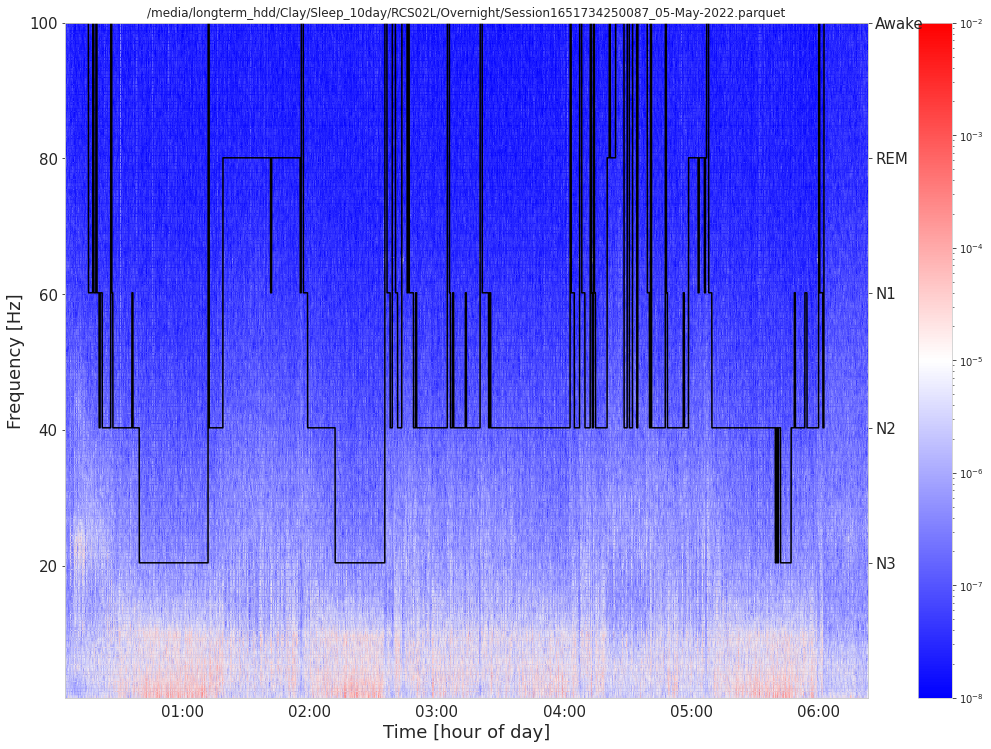

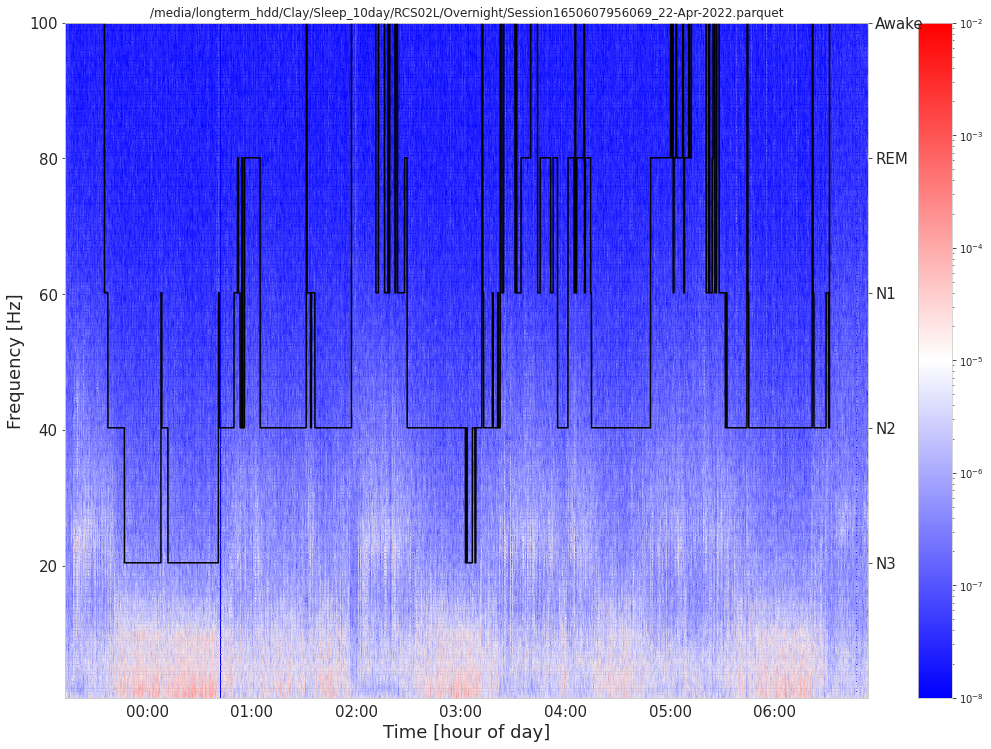

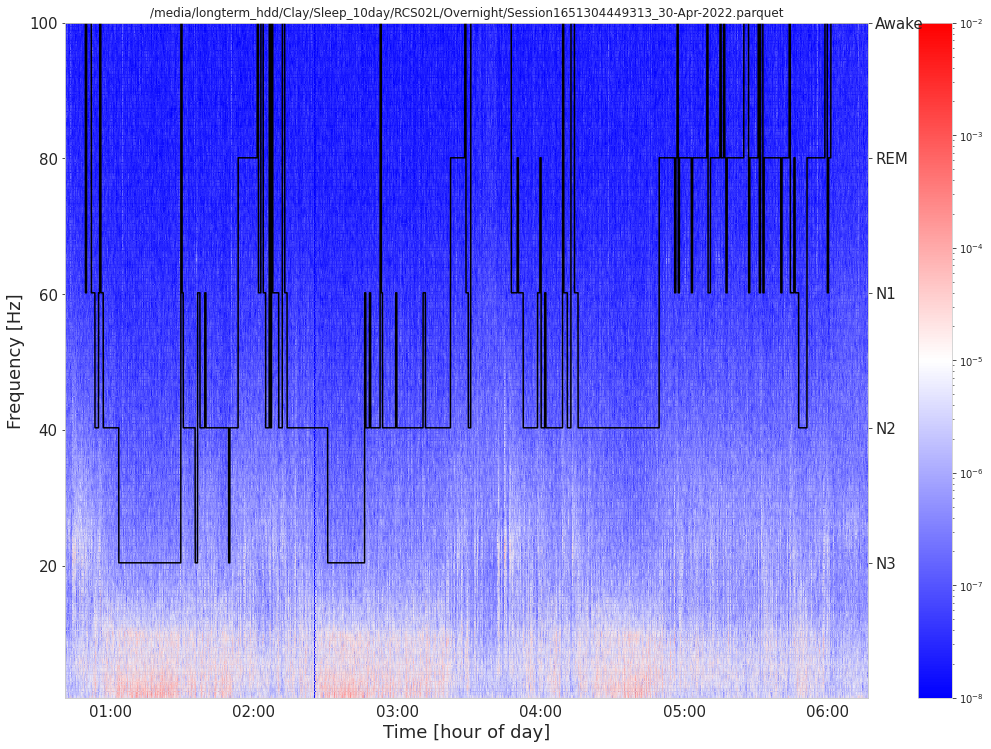

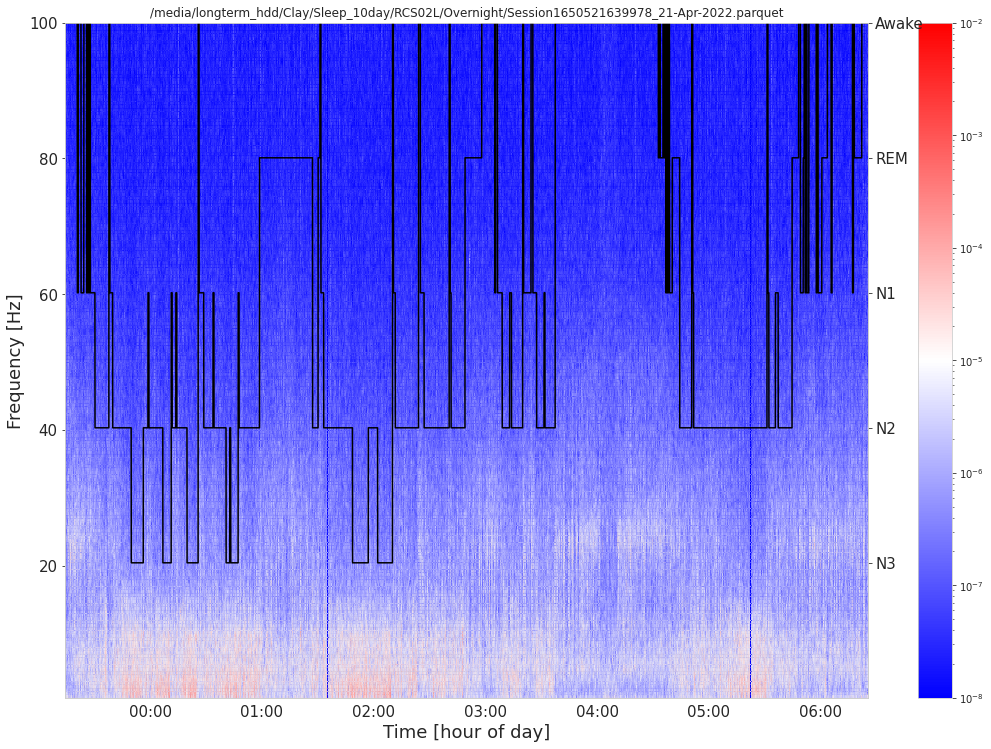

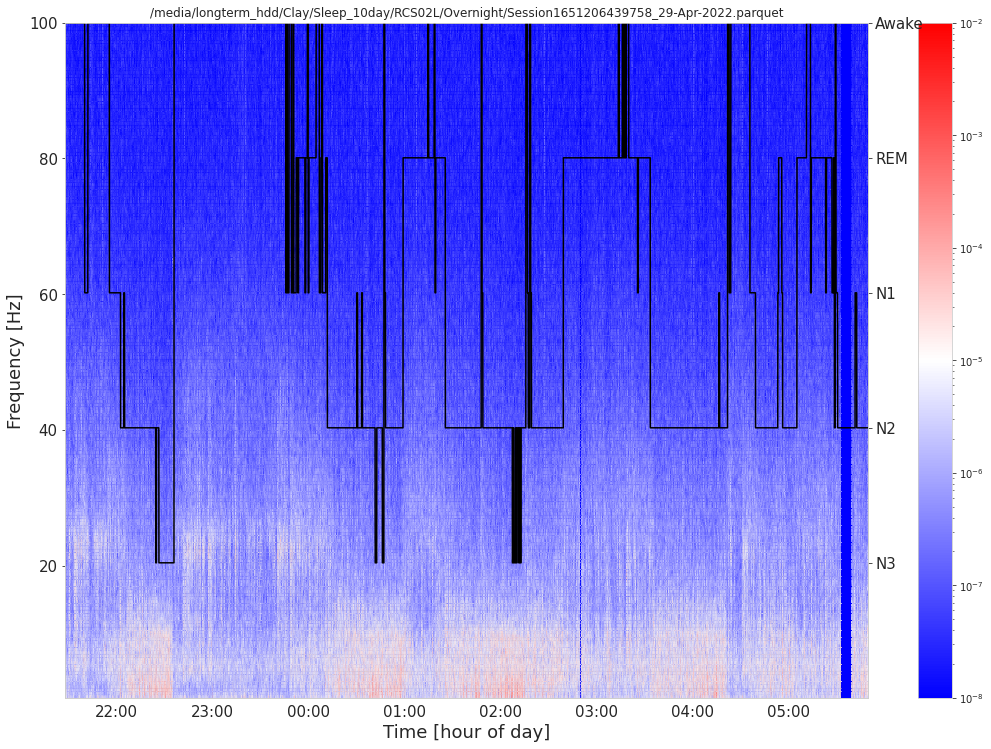

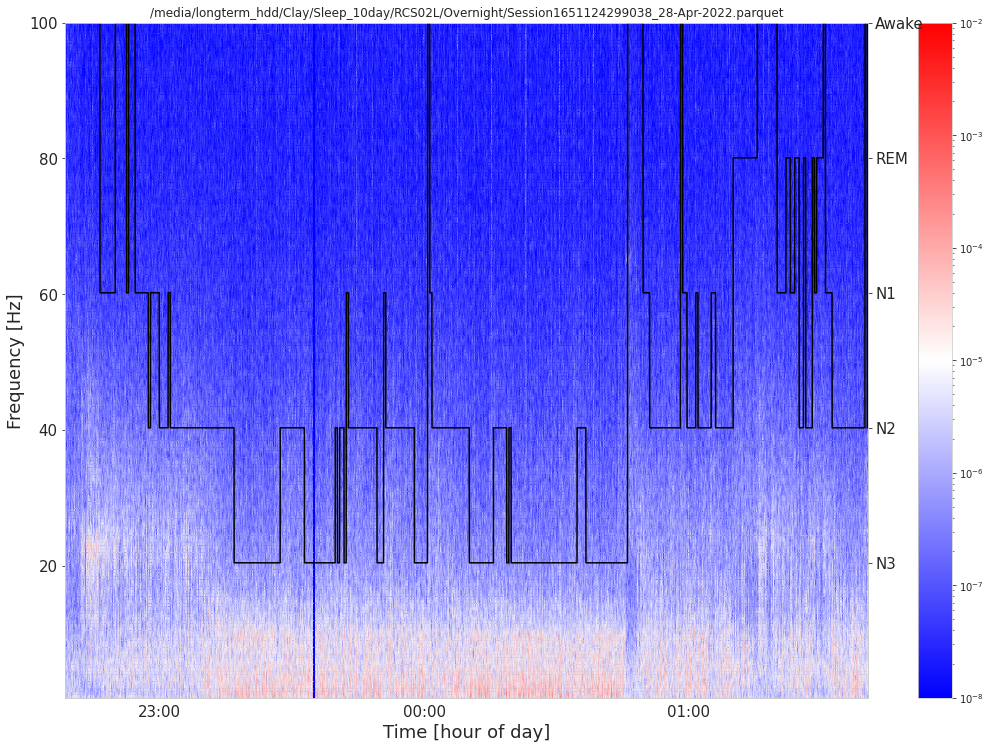

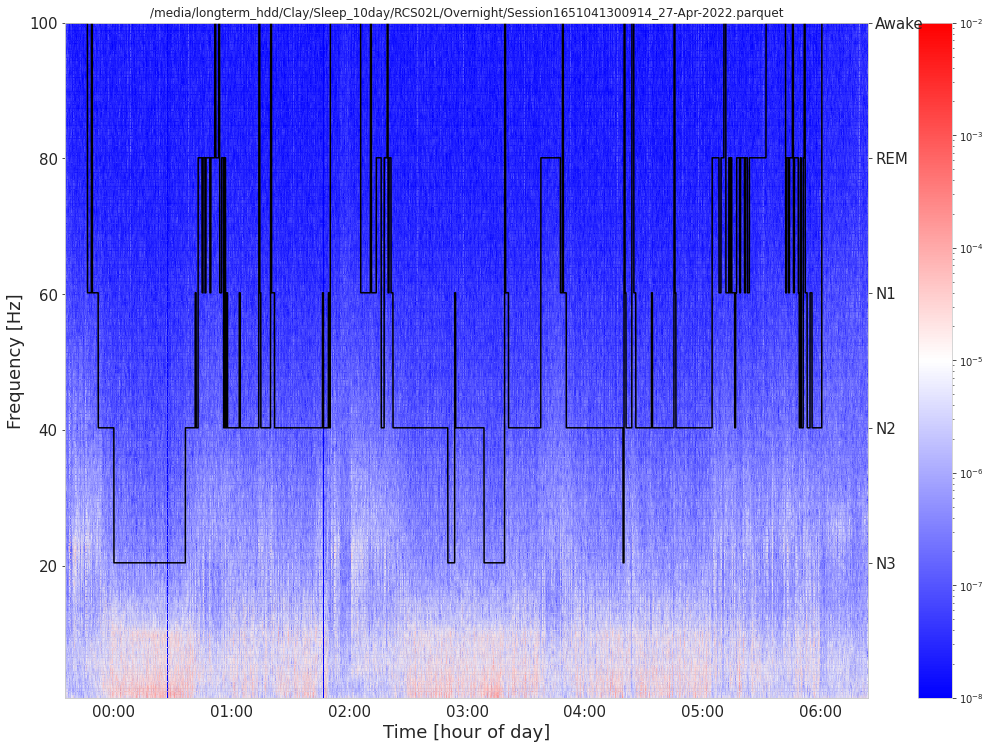

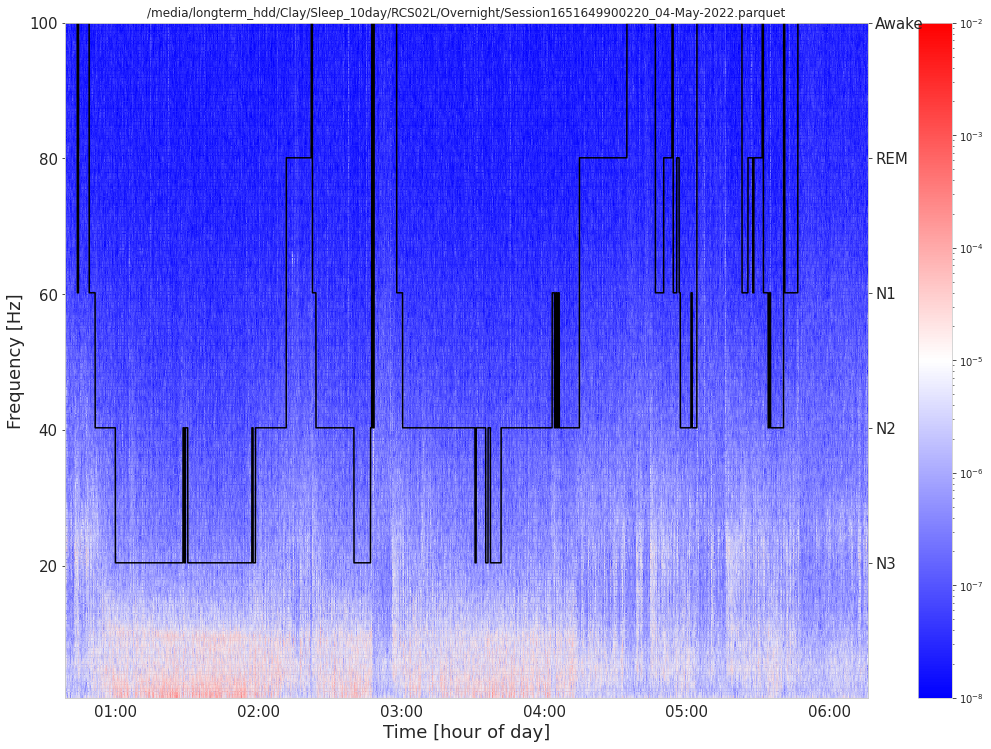

CPU times: user 3min 5s, sys: 53.7 s, total: 3min 58s
Wall time: 3min 14s


In [9]:
plot_spec = partial(plot_spec_hypno_overlay, sample_rate=500, window_length=1000, overlap=500, freq_range=np.s_[1:201], max=10**-2)

for f in raw_data_files:
    df_tmp = pd.read_parquet(f)
    plot_spec(df_tmp, 'TD_key3', title=f)